# Cherian et al (2021) JPO Figures

This is a clean up notebook to reproduce Figures 2 to 12 from Cherian et al (2021)

## Requirements

1. Datasets


## Modifications

1. Change dask cluster configuration
2. Change `rootdir` 

In [ ]:
%matplotlib inline
%load_ext watermark

import cf_xarray
import dask
import dcpy
import distributed
import holoviews as hv
import hvplot.xarray
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.units as munits
import numpy as np
import pandas as pd
import seawater as sw
import xarray as xr

import pump

munits.registry[np.datetime64] = mdates.ConciseDateConverter()
xr.set_options(keep_attrs=True)
mpl.rcParams["figure.dpi"] = 180

%watermark -iv

xr.DataArray([1.0])

matplotlib : 3.3.2
cf_xarray  : 0.2.1.dev17+gc2b95c4.d20200820
dask       : 2.30.0
holoviews  : 1.13.4
xarray     : 0.16.2
distributed: 2.30.0
pandas     : 1.1.3
pump       : 0.1
seawater   : 3.3.4
numpy      : 1.19.2
dcpy       : 0.1
hvplot     : 0.6.0



<xarray.DataArray (dim_0: 1)>
array([1.])
Dimensions without coordinates: dim_0

## Setup dask cluster

In [ ]:
if "client" in locals():
    client.close()
if "cluster" in locals():
    cluster.close()

env = {"OMP_NUM_THREADS": "3", "NUMBA_NUM_THREADS": "3"}


# on cheyenne
cluster = distributed.LocalCluster(n_workers=6, threads_per_worker=1, env=env)
cluster

In [ ]:
# on casper
import dask_jobqueue

cluster = dask_jobqueue.SLURMCluster(
    cores=1,
    processes=1,
    memory="25GB",
    walltime="08:00:00",
    project="NCGD0011",
    scheduler_options=dict(dashboard_address=":9797"),
)
# cluster = dask_jobqueue.PBSCluster(
#    cores=9, processes=9, memory="108GB", walltime="02:00:00", project="NCGD0043",
#    env_extra=env,
# )

cluster.scale(6)
cluster

## Setup client

In [ ]:
client = distributed.Client(cluster)
client

Client Scheduler: tcp://10.12.205.27:37937 Dashboard: https://jupyterhub.ucar.edu/dav/user/dcherian/proxy/9797/status,Cluster Workers: 0 Cores: 0 Memory: 0 B


## Read data

In [ ]:
rootdir = "/glade/scratch/dcherian/Cherian-et-al-2021-TIW/"

In [ ]:
period4 = xr.open_mfdataset(f"{rootdir}/tiw_hourly/File_*.nc", parallel=True)
metrics = xr.load_dataset(f"{rootdir}/tiw_hourly/metrics.nc")
metrics = metrics.reindex_like(
    period4, method="nearest"
)  # correct small floating point errors
period4

<xarray.Dataset>
Dimensions:    (depth: 269, latitude: 400, longitude: 3, time: 779)
Coordinates:
  * latitude   (latitude) float32 -10.0 -9.95 -9.9 -9.85 ... 9.85 9.9 9.95 10.0
  * longitude  (longitude) float32 -110.1 -110.0 -110.0
  * time       (time) datetime64[ns] 1995-11-15 ... 1995-12-17T10:00:00
  * depth      (depth) float32 -0.5 -1.5 -2.5 -3.5 ... -290.1 -295.0 -300.3
Data variables: (12/17)
    KPPhbl     (time, latitude, longitude) float32 dask.array<chunksize=(1, 400, 3), meta=np.ndarray>
    KPPbo      (time, latitude, longitude) float32 dask.array<chunksize=(1, 400, 3), meta=np.ndarray>
    KPPviscA   (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    KPPdiffT   (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    KPPRi      (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    KPPg_TH    (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    ...         ...
    DFrI_TH    (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    VISrI_Um   (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    VISrI_Vm   (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    Um_Diss    (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    Vm_Diss    (time, depth, latitude, longitude) float32 dask.array<chunksize=(1, 269, 400, 3), meta=np.ndarray>
    ETAN       (time, latitude, longitude) float32 dask.array<chunksize=(1, 400, 3), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    institution:  National Center for Atmospheric Research
    source:       MIT General Circulation Model (MITgcm) checkpoint 64v
    references:   Cherian et al. (2021) Off-equatorial deep-cycle turbulence ...
    title:        Hourly averaged fields from tropical Pacific cold tongue re...

In [ ]:
period4.latitude.attrs["units"] = "°N"

# from http://mailman.mitgcm.org/pipermail/mitgcm-support/2010-December/006921.html
period4["Um_Impl"] = period4.VISrI_Um.diff("depth", label="lower") / (
    metrics.rAw * metrics.drF * metrics.hFacW
)
period4["Vm_Impl"] = period4.VISrI_Vm.diff("depth", label="lower") / (
    metrics.rAw * metrics.drF * metrics.hFacW
)


# convert to local time
period4["time"] = period4["time"] - pd.Timedelta("7h")

period4["dens"] = pump.mdjwf.dens(period4.salt, period4.theta, np.array([0.0]))
period4 = pump.calc.calc_reduced_shear(period4)
period4["mld"] = pump.calc.get_mld(period4.dens)
period4["dcl_base"] = pump.calc.get_dcl_base_Ri(period4)
period4["dcl"] = period4["mld"] - period4["dcl_base"]
period4["sst"] = period4.theta.isel(depth=0)

period4["mld"], period4["dcl_base"], period4["dcl"] = dask.compute(
    period4.mld, period4.dcl_base, period4.dcl
)

# period4 = period4.persist()

period4["eucmax"] = pump.calc.get_euc_max(
    period4.u.sel(latitude=0, method="nearest", drop=True)
)

period4["Jq"] = 1035 * 3995 * period4.DFrI_TH.fillna(0) / metrics.RAC
period4.Jq.attrs["long_name"] = "$J_q^t$"
period4.Jq.attrs["units"] = "W/m²"


period4["nonlocal_flux"] = 1035 * 3995 * period4.KPPg_TH.fillna(0) / metrics.RAC
period4.nonlocal_flux.attrs["long_name"] = "KPP non-local flux"
period4.nonlocal_flux.attrs["units"] = "W/m²"

snapshot_times = pd.to_datetime(
    [
        "1995-11-18 00:00",
        "1995-11-26 06:00",
        "1995-12-03 18:00",
    ]
)

period4["dcl_mask"] = (
    (period4.depth < period4.mld)
    & (period4.depth > period4.dcl_base)
    & (period4.dcl > 30)
)

/glade/u/home/dcherian/python/xarray/xarray/core/indexing.py:1369: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]
/glade/u/home/dcherian/python/xarray/xarray/core/indexing.py:1369: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]


calc uz
calc vz
calc S2
calc N2
calc shred2
Calc Ri


In [ ]:
import dcpy.interpolate

period4["hRib"] = (
    dcpy.interpolate.pchip_roots_old(
        period4.KPPRi.sortby("depth").chunk({"depth": -1}), dim="depth", target=0.3
    ).squeeze()
    # .persist()
)

TypeError: Failed in nopython mode pipeline (step: fix up args)
Signature mismatch: 4 argument types given, but function takes 5 arguments

In [ ]:
vort = pump.calc.vorticity(period4).isel(longitude=1)  # .compute()

## Figure 2: Daily Averaged Fields

This is a truncated version of the Figure in the paper (160°W to 100°W) instead of (170°W to 95°W)

In [ ]:
snapshot = xr.load_dataset(f"{rootdir}/full_domain/1995-12-04.nc")
metrics_full = xr.open_dataset(f"{rootdir}/full_domain/metrics.nc").reindex_like(
    snapshot, method="nearest"
)

In [ ]:
snapshot["dens"] = pump.mdjwf.dens(snapshot.salt, snapshot.theta, np.array([0.0]))
snapshot = pump.calc.calc_reduced_shear(snapshot)

snapshot["Jq"] = 1035 * 3995 * snapshot.DFrI_TH.fillna(0) / metrics_full.RAC
snapshot.Jq.attrs["long_name"] = "$J_q^t$"
snapshot.Jq.attrs["units"] = "W/m²"

snapshot["mld"] = pump.calc.get_mld(snapshot.dens)
snapshot["dcl_base"] = pump.calc.get_dcl_base_Ri(snapshot)
snapshot["dcl"] = snapshot["mld"] - snapshot["dcl_base"]
snapshot["dcl"] = snapshot.dcl.where(snapshot.dcl > 5, 0)

# Integrate J in dcl later
snapshot["ijq"] = (
    snapshot.Jq.sel(depth=slice(-250))
    .where(
        (snapshot.depth.sel(depth=slice(-250)) < snapshot.mld)
        & (snapshot.depth >= snapshot.dcl_base)
    )
    .sum("depth")
)

snapshot["umean"] = snapshot.u.sel(depth=slice(-50, -250)).mean("depth")

snapshot["sst"] = snapshot.theta.isel(depth=0)
snapshot["sst"].attrs["long_name"] = "SST"
snapshot["sst"].attrs["units"] = "°C"

snapshot["oceQnet"].attrs["long_name"] = "$Q_{net}$"
snapshot["oceQnet"].attrs["units"] = "W/m²"

snapshot["ijq"].attrs["long_name"] = "Avg. $J_q^t$ in low Ri layer"
snapshot["ijq"].attrs["units"] = "W/m²"

snapshot["dcl"].attrs["long_name"] = "Low Ri layer width"
snapshot["dcl"].attrs["units"] = "m"

snapshot["umean"].attrs["long_name"] = "Mean 50-250m $u$"
snapshot["umean"].attrs["units"] = "m/s"

snapshot

<xarray.Dataset>
Dimensions:          (depth: 269, latitude: 320, longitude: 1200, time: 1)
Coordinates:
  * latitude         (latitude) float32 -7.992 -7.942 -7.891 ... 7.942 7.992
  * longitude        (longitude) float32 -160.0 -159.9 -159.9 ... -100.1 -100.0
  * depth            (depth) float32 -0.5 -1.5 -2.5 ... -290.1 -295.0 -300.3
  * time             (time) datetime64[ns] 1995-12-04T12:00:00
Data variables:
    theta            (depth, latitude, longitude) float32 28.34 28.33 ... 10.41
    u                (depth, latitude, longitude) float32 -0.2 ... 0.0009061
    v                (depth, latitude, longitude) float32 -0.1161 ... -0.006646
    w                (depth, latitude, longitude) float32 -4.815e-07 ... 4.92...
    salt             (depth, latitude, longitude) float32 35.44 35.44 ... 34.73
    KPP_diffusivity  (depth, latitude, longitude) float32 nan nan ... 1e-05
    DFrI_TH          (depth, latitude, longitude) float32 nan nan ... -4.169
    oceQnet          (latitude, longitude) float32 -14.14 -14.29 ... 29.72 29.61
    oceQsw           (latitude, longitude) float32 343.5 345.2 ... 189.1 189.4
    dens             (depth, latitude, longitude) float64 1.023e+03 ... 1.027...
    uz               (depth, latitude, longitude) float32 -0.01034 ... 0.0002425
    vz               (depth, latitude, longitude) float32 -0.01854 ... 9.885e-05
    S2               (depth, latitude, longitude) float32 0.0004507 ... 6.859...
    shear            (depth, latitude, longitude) float32 0.02123 ... 0.0002619
    N2               (depth, latitude, longitude) float64 -1.708e-05 ... 1.85...
    shred2           (depth, latitude, longitude) float64 0.000519 ... -7.409...
    Ri               (depth, latitude, longitude) float64 -0.03791 ... 270.3
    Jq               (depth, latitude, longitude) float64 0.0 0.0 ... -0.5633
    mld              (latitude, longitude) float32 -32.5 -33.5 ... -10.5 -10.5
    dcl_base         (latitude, longitude) float32 -32.5 -33.5 ... -10.5 -10.5
    dcl              (latitude, longitude) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    ijq              (latitude, longitude) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    umean            (latitude, longitude) float32 -0.2112 -0.2066 ... 0.04643
    sst              (latitude, longitude) float32 28.34 28.33 ... 26.21 26.22
Attributes:
    Conventions:  CF-1.6
    institution:  National Center for Atmospheric Research
    source:       MIT General Circulation Model (MITgcm) checkpoint 64v
    references:   Cherian et al. (2021) Off-equatorial deep-cycle turbulence ...
    title:        Daily averaged fields from tropical Pacific cold tongue reg...

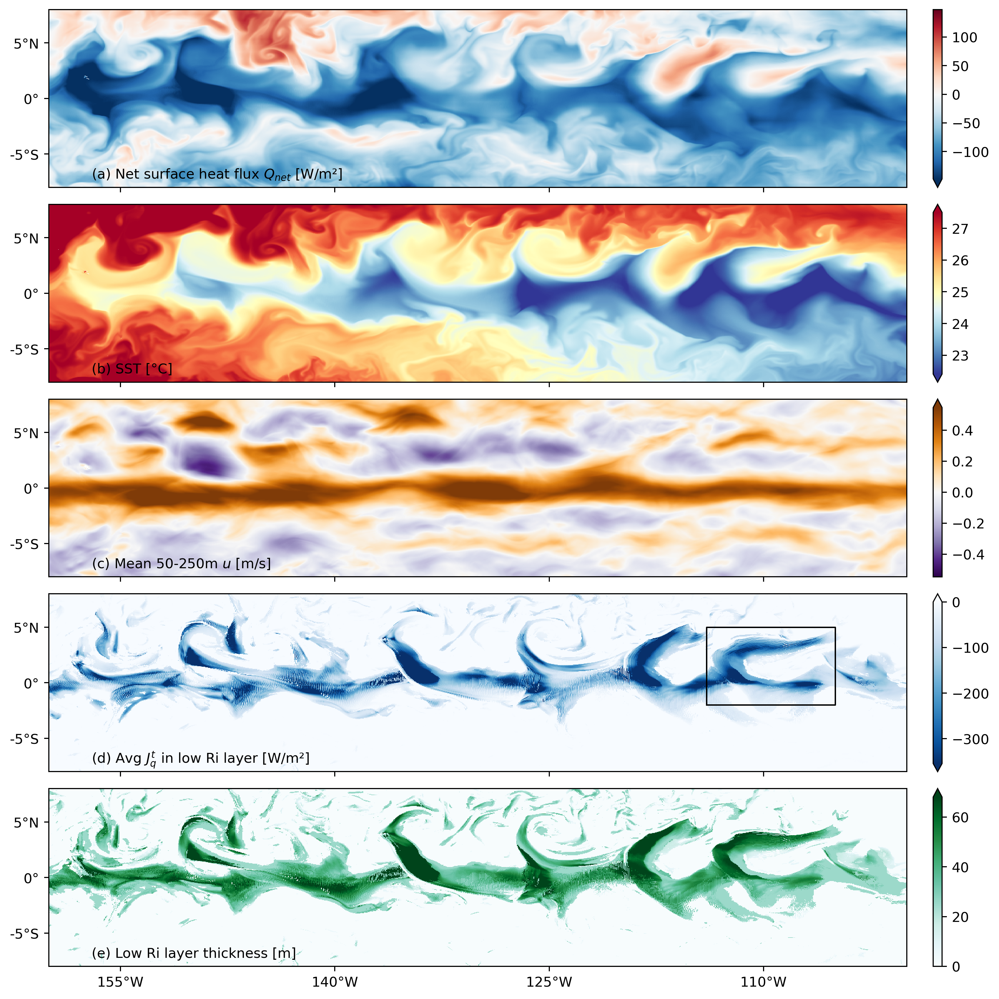

In [ ]:
f, axx = plt.subplots(
    5, 1, constrained_layout=True, sharex=True, sharey=True, squeeze=False
)
ax = dict(zip(["sflx", "sst", "umean", "jqt", "dcl"], axx.flat))
cbar_kwargs = {"label": ""}

(-1 * snapshot.oceQnet).plot(
    ax=ax["sflx"], robust=True, cmap=mpl.cm.RdBu_r, center=0, cbar_kwargs=cbar_kwargs
)

snapshot.sst.plot(
    x="longitude",
    robust=True,
    cmap=mpl.cm.RdYlBu_r,
    ax=ax["sst"],
    vmax=27.5,
    cbar_kwargs=cbar_kwargs,
)

snapshot.umean.plot(
    ax=ax["umean"], robust=True, cmap=mpl.cm.PuOr_r, cbar_kwargs=cbar_kwargs
)

(snapshot.ijq / 50).plot(
    x="longitude",
    ax=ax["jqt"],
    vmax=0,
    robust=True,
    cmap=mpl.cm.Blues_r,
    cbar_kwargs=cbar_kwargs,
)

snapshot.dcl.plot(
    x="longitude", ax=ax["dcl"], robust=True, cmap=mpl.cm.BuGn, cbar_kwargs=cbar_kwargs
)

axx[0, 0].set_yticks([-10, -5, 0, 5, 10])
axx[-1, 0].set_xticks([-110, -125, -140, -155])

ax["jqt"].plot([-114, -105, -105, -114, -114], [-2, -2, 5, 5, -2], color="k", lw=1)

[dcpy.plots.lat_lon_ticks(aa) for aa in axx.flat]
axx[0, 0].set_ylim([-8, 8])
dcpy.plots.clean_axes(axx)
dcpy.plots.label_subplots(
    axx.squeeze(),
    labels=[
        "Net surface heat flux $Q_{net}$ [W/m²]",
        "SST [°C]",
        "Mean 50-250m $u$ [m/s]",
        "Avg $J_q^t$ in low Ri layer [W/m²]",
        "Low Ri layer thickness [m]",
    ],
    y=0.05,
)
f.set_size_inches((10, 10))
# f.savefig("images/snapshot-sflx-sst-jq-dcl.png")

## Figure 3: DCL everywhere

In [ ]:
sections = xr.open_dataset(
    f"{rootdir}/sections.nc", chunks={"longitude": 1, "latitude": 80}
)
sections["dens"] = pump.mdjwf.dens(sections.salt, sections.theta, np.array([0.0]))
sections = pump.calc.calc_reduced_shear(sections)
sections["mld"] = pump.calc.get_mld(sections.dens)
sections

calc uz
calc vz
calc S2
calc N2
calc shred2
Calc Ri


<xarray.Dataset>
Dimensions:          (depth: 268, latitude: 400, longitude: 4, time: 1464)
Coordinates:
  * depth            (depth) float32 -0.5 -1.5 -2.5 ... -285.6 -290.1 -295.0
  * latitude         (latitude) float32 -9.996 -9.946 -9.896 ... 9.946 9.996
  * longitude        (longitude) int64 -110 -125 -140 -155
  * time             (time) datetime64[ns] 1995-09-01 ... 1996-05-01T20:00:00
Data variables:
    Jq               (time, depth, latitude, longitude) float64 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    KPP_diffusivity  (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    salt             (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    theta            (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    u                (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    v                (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    w                (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    dens             (time, depth, latitude, longitude) float64 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    uz               (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    vz               (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    S2               (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    shear            (time, depth, latitude, longitude) float32 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    N2               (time, depth, latitude, longitude) float64 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    shred2           (time, depth, latitude, longitude) float64 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    Ri               (time, depth, latitude, longitude) float64 dask.array<chunksize=(1464, 268, 80, 1), meta=np.ndarray>
    mld              (time, latitude, longitude) float32 dask.array<chunksize=(1464, 80, 1), meta=np.ndarray>
Attributes:
    easting:            longitude
    field_julian_date:  400296
    julian_day_unit:    days since 1950-01-01 00:00:00
    northing:           latitude
    title:              4-hourly snapshots of fields from regional simulation
    Conventions:        CF-1.6
    institution:        National Center for Atmospheric Research
    source:             MIT General Circulation Model (MITgcm) checkpoint 64v
    references:         Cherian et al. (2021) Off-equatorial deep-cycle turbu...

In [ ]:
medianRi = (
    sections.Ri.where(
        (sections.depth < sections.mld) & (sections.depth > sections.mld - 40)
    )
    .resample(time="D")
    .median(["time", "depth"])
    .compute()
)
medianRi = medianRi.assign_coords(longitude=np.round(medianRi.longitude))
medianRi.attrs["long_name"] = "Median $Ri$ within 40m of the mixed layer base"

sst = sections.theta.isel(depth=0).rolling(time=6).mean().persist()
u = (
    sections.u.sel(depth=slice(-250))
    .rolling(time=4 * 6, min_periods=1)
    .mean()
    .persist()
)
eucmax = pump.calc.get_euc_bounds(u).compute()

/glade/u/home/dcherian/miniconda3/envs/dcpy/lib/python3.8/site-packages/xarray/core/indexing.py:1369: PerformanceWarning: Slicing is producing a large chunk. To accept the large
chunk and silence this warning, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ...     array[indexer]

To avoid creating the large chunks, set the option
    >>> with dask.config.set(**{'array.slicing.split_large_chunks': True}):
    ...     array[indexer]
  return self.array[key]


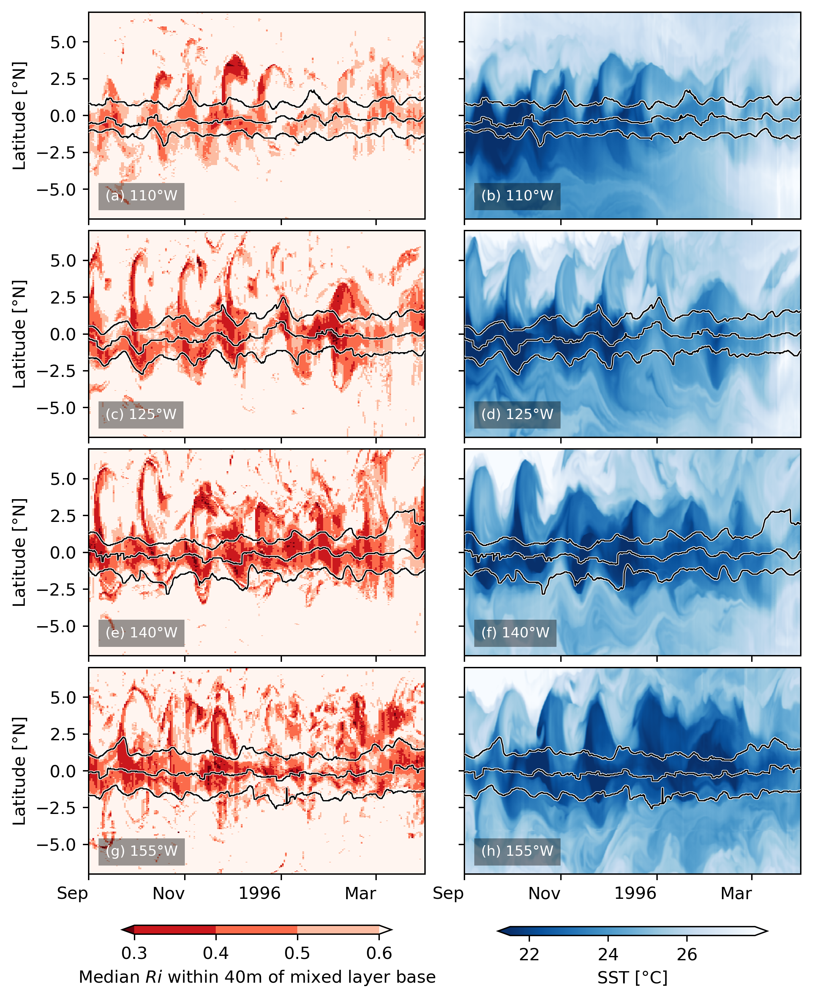

In [ ]:
import itertools

import facetgrid

labels = [lon + "°W" for lon in str(np.abs(medianRi.longitude.values))[1:-1].split(" ")]
cbkwargs = {"orientation": "horizontal", "shrink": 0.8, "aspect": 30}


def plot_euc(ax, loc):
    kwargs = dict(ax=ax, _labels=False, add_legend=False, hue="variable", zorder=10)
    eucmax.sel(**loc).to_array().plot.line(color="w", lw=1.5, **kwargs)
    eucmax.sel(**loc).to_array().plot.line(color="k", lw=0.75, **kwargs)
    ax.set_title("")


with plt.rc_context({"font.size": 10}):
    fg = facetgrid.facetgrid(row=medianRi.longitude, col=["Ri", "SST"])
    fg.map_col(
        "Ri",
        medianRi.sel(latitude=slice(-7, 7)),
        xr.plot.pcolormesh,
        x="time",
        levels=np.arange(0.3, 0.61, 0.1),
        cmap=mpl.cm.Reds_r,
        add_labels=False,
        add_colorbar=False,
    )
    fg.map_col(
        "SST",
        sst.sel(latitude=slice(-7, 7)),
        xr.plot.pcolormesh,
        robust=True,
        cmap=mpl.cm.Blues_r,
        add_labels=False,
        add_colorbar=False,
    )
    fg.set_ylabels("Latitude [°N]")

    fg.fig.set_size_inches(dcpy.plots.pub_fig_width("jpo", "two column"), 8)
    fg.fig.colorbar(
        fg.handles["Ri"][0],
        ax=fg.axes[:, 0],
        **cbkwargs,
        label="Median $Ri$ within 40m of mixed layer base",
    )
    fg.fig.colorbar(
        fg.handles["SST"][0],
        ax=fg.axes[:, 1],
        **cbkwargs,
        label="SST [°C]",
        extend="both",
    )
    dcpy.plots.label_subplots(
        fg.axes.flat,
        y=0.09,
        labels=list(itertools.chain(*[(v, v) for v in labels])),
        color="w",
        bbox=dict(alpha=0.4, color="black", linewidth=0),
        fontsize="small",
    )
    for loc, ax in zip(fg.row_locs, fg.axes):
        [plot_euc(aa, {"longitude": loc}) for aa in ax]
    [dcpy.plots.concise_date_formatter(ax, show_offset=False) for ax in fg.axes[-1, :]]

fg.axes[0, 0].set_xlim((None, "1996-Apr-01"))

## Figure 4: 0, 3.5N deep cycle heat flux + Ri profile

Text(0.7, 0.53, '$J_q^t$ [W/m²]')

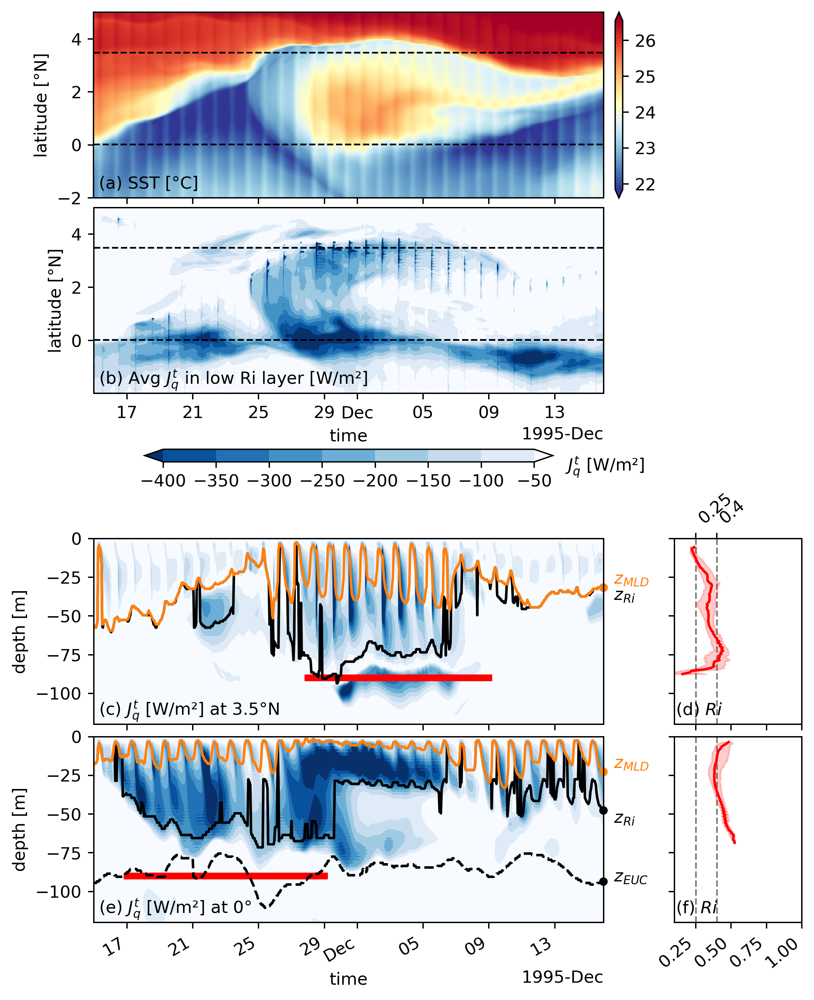

In [ ]:
f, ax = pump.plot.plot_jq_sst(
    period4.isel(longitude=1),
    lon=-110,
    periods=slice("1995-11-15", "1995-12-15"),
    lat=[0, 3.5],
    time_Ri={
        0: slice("1995-11-17", "1995-11-29"),
        3.5: slice("1995-11-28", "1995-12-09"),
    },
)

axes = list(ax.flat)
del axes[1]
del axes[2]
[aa.set_title("") for aa in ax[:, 0]]
axes[-2].set_xlabel("time")
dcpy.plots.label_subplots(
    axes,
    x=0.01,
    y=0.05,
    labels=[
        "SST [°C]",
        "Avg $J_q^t$ in low Ri layer [W/m²]",
        "$J_q^t$ [W/m²] at 3.5°N",
        "$Ri$",
        "$J_q^t$ [W/m²] at 0°",
        "$Ri$",
    ],
)
f.text(0.7, 0.53, "$J_q^t$ [W/m²]")

## Figure 5: daily cycles at 3.5N

In [ ]:
ds = (
    period4.isel(longitude=1)
    .sel(time=slice("1995-11-25", "1995-12-07"), depth=slice(-100))
    # .sel(time=slice("1995-11-05", "1995-12-15"), depth=slice(-130))
    .sel(latitude=3.5, method="nearest")
    .assign(latitude=3.5)
).compute()
ds["Jq"] = ds.Jq.rolling(depth=2).mean()

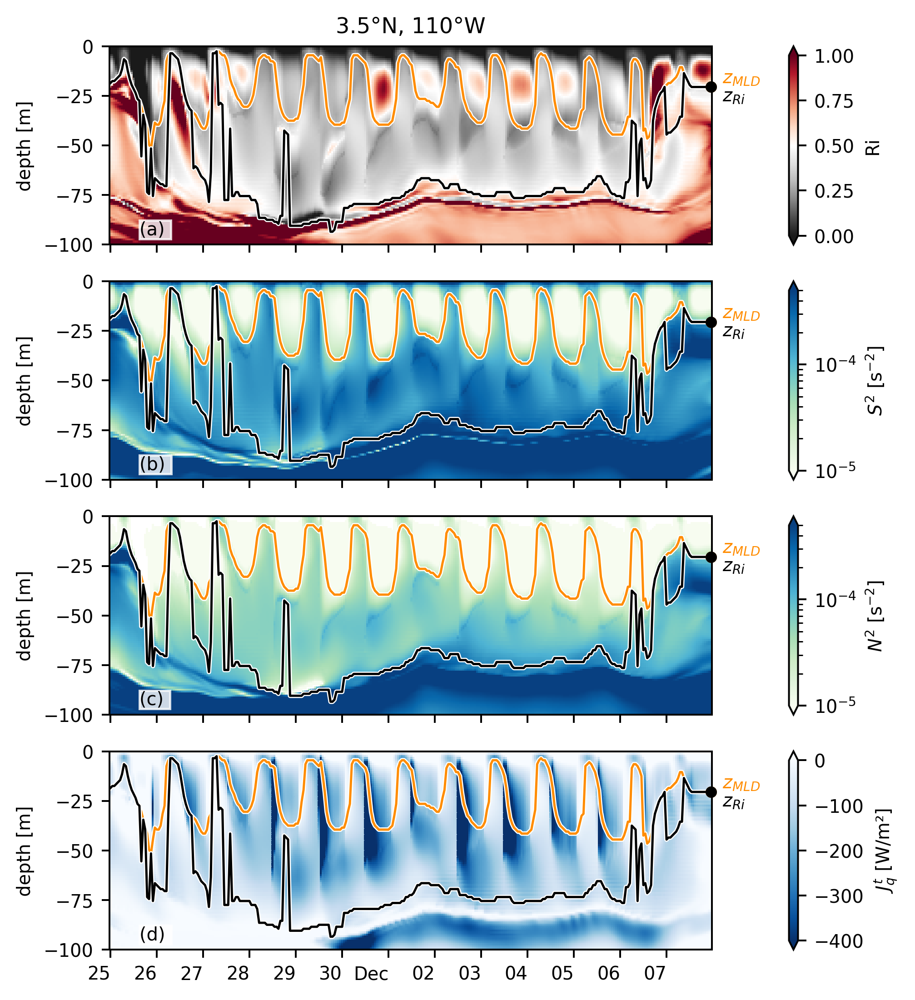

In [ ]:
with plt.rc_context({"font.size": 8}):
    f, _ = pump.plot.plot_daily_cycles(ds)

## Figure 6: TIW lat-depth slices

In [ ]:
subset = (
    period4.set_coords(["mld", "dcl_base"])
    .sel(latitude=slice(-3, 6))
    .isel(longitude=1)[["sst", "uz", "vz", "mld", "dcl_base", "dcl_mask", "S2", "N2"]]
).compute()

<Figure size 1165.63x900 with 0 Axes>

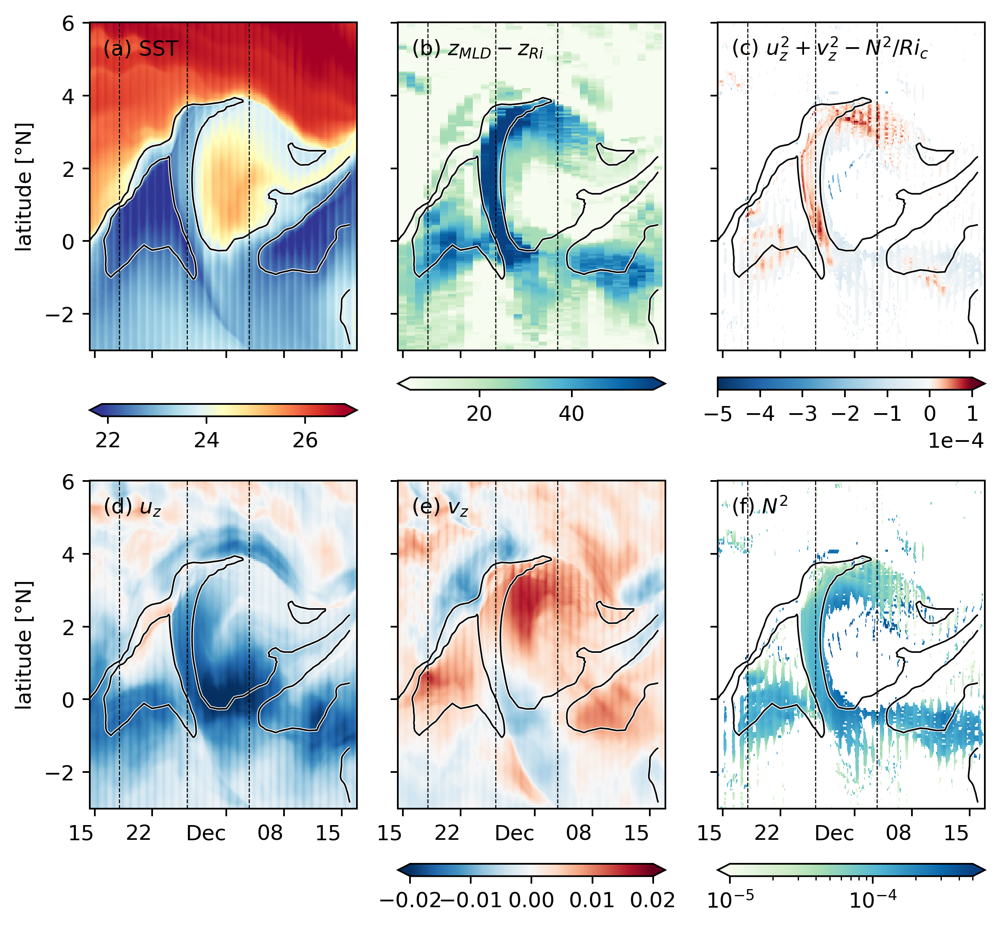

In [ ]:
pump.plot.plot_tiw_lat_lon_summary(subset, times=snapshot_times)

## Figure 7: Shred2 depth-lat snapshots

array([[<AxesSubplot:title={'center':'$J_q^t$'}, ylabel='depth [m]'>,
        <AxesSubplot:title={'center':'$u_z^2 + v_z^2- N²/Ri_c$'}>,
        <AxesSubplot:title={'center':'$u_z^2 - N²/2/Ri_c$'}>,
        <AxesSubplot:title={'center':'$v_z^2 - N²/2/Ri_c$'}>],
       [<AxesSubplot:ylabel='depth [m]'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='depth [m]'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

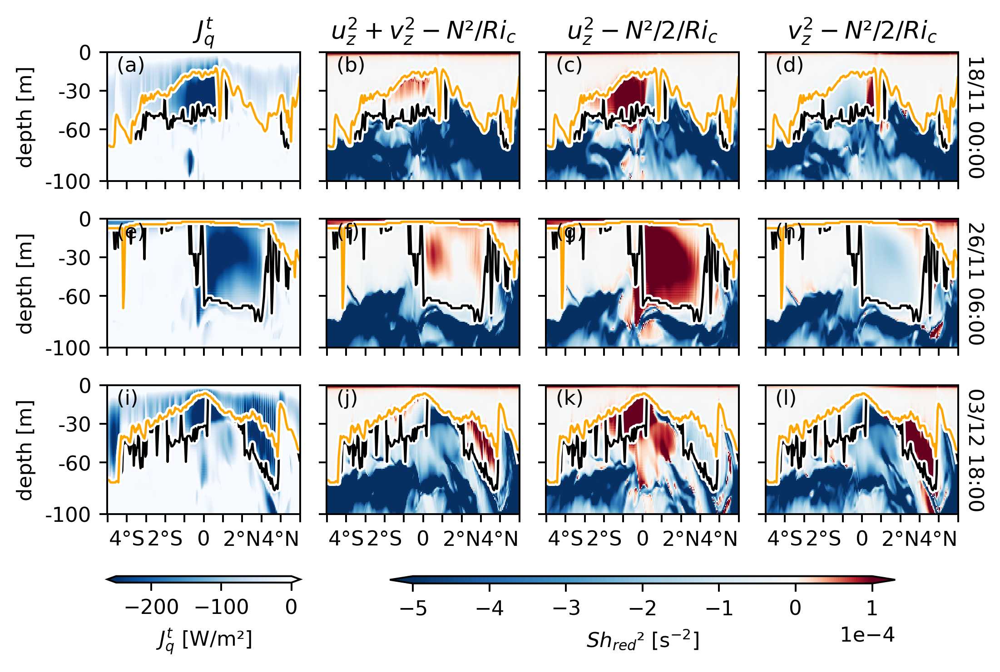

In [ ]:
pump.plot.plot_tiw_period_snapshots(
    period4.set_coords(["mld", "dcl_base"]).sel(latitude=slice(-5, 5)),
    lon=-110,
    period=None,
    times=snapshot_times,
)

## Figure 8: horizontal vorticity vector

Uses daily average output instead of snapshot in the paper

In [ ]:
tiw = xr.open_dataset(f"{rootdir}/full_domain/1995-12-01.nc").sel(
    longitude=slice(-115, -106)
)
tiw_vort = pump.calc.vorticity(tiw)
tiw["dens"] = pump.mdjwf.dens(tiw.salt, tiw.theta, tiw.depth)
tiw = pump.calc.calc_reduced_shear(tiw)
tiw["mld"] = pump.calc.get_mld(tiw.dens)
tiw["dcl_base"] = pump.calc.get_dcl_base_Ri(tiw)
tiw["dcl"] = tiw["mld"] - tiw["dcl_base"]

<xarray.Dataset>
Dimensions:    (depth: 269, latitude: 320, longitude: 180)
Coordinates:
  * latitude   (latitude) float32 -7.992 -7.942 -7.891 ... 7.891 7.942 7.992
  * longitude  (longitude) float32 -115.0 -114.9 -114.9 ... -106.1 -106.1 -106.0
  * depth      (depth) float32 -0.5 -1.5 -2.5 -3.5 ... -290.1 -295.0 -300.3
Data variables:
    x          (depth, latitude, longitude) float32 -0.005686 ... 0.000371
    y          (depth, latitude, longitude) float32 -0.02091 ... -7.049e-05
    z          (depth, latitude, longitude) float32 -2.698e-06 ... 2.171e-06
    vx         (depth, latitude, longitude) float32 8.933e-07 ... 1.769e-06
    uy         (depth, latitude, longitude) float32 3.591e-06 ... -4.018e-07
    vy         (depth, latitude, longitude) float32 -7.317e-07 ... -1.102e-06
    f          (latitude) float32 -2.022e-05 -2.009e-05 ... 2.009e-05 2.022e-05

[Text(0.025, 1.02, '(a) 110°W'), Text(0.025, 1.02, '(b) 1995-Dec-01 00:00')]

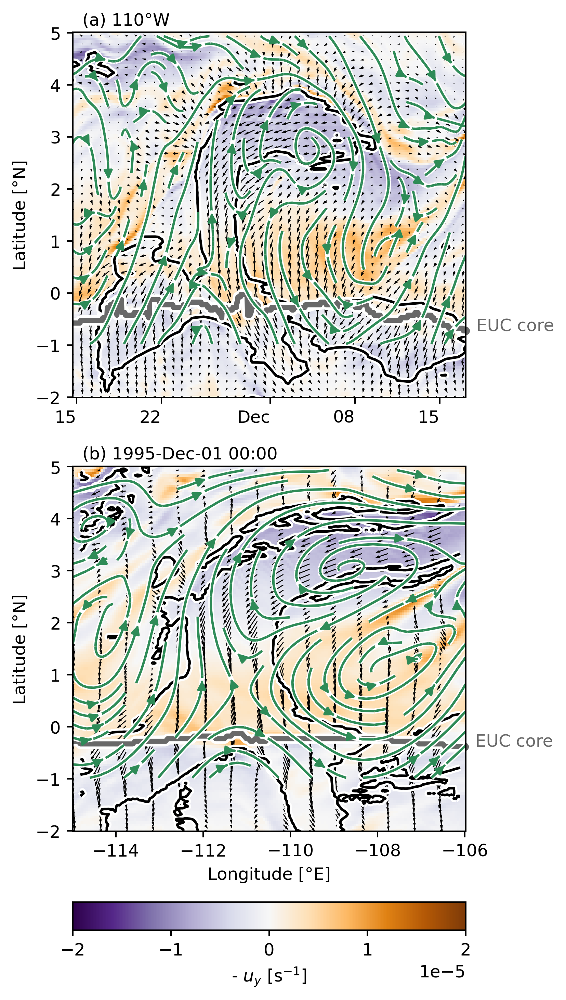

In [ ]:
f, ax = plt.subplots(2, 1, sharey=True, constrained_layout=True)
pump.plot.vor_streamplot(
    period4, vort, stride=3, refspeed=0.5, ax=ax[0], colorbar=False
)
pump.plot.vor_streamplot(
    tiw, tiw_vort, stride=2, refspeed=0.5, x="longitude", scale=0.4, ax=ax[1]
)
f.set_size_inches((dcpy.plots.pub_fig_width("jpo", "medium 1"), 8))
dcpy.plots.label_subplots(ax, y=1.02, x=0.025, labels=["110°W", "1995-Dec-01 00:00"])

## Figure 9: shear evolution + snapshots

In [ ]:
duzdt, dvzdt = dask.compute(*pump.calc.estimate_shear_evolution_terms(period4))

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP  local=tcp://127.0.0.1:44764 remote=tcp://127.0.0.1:33191>


[None, None, None, None, None, None, None, None, None, None, None, None]

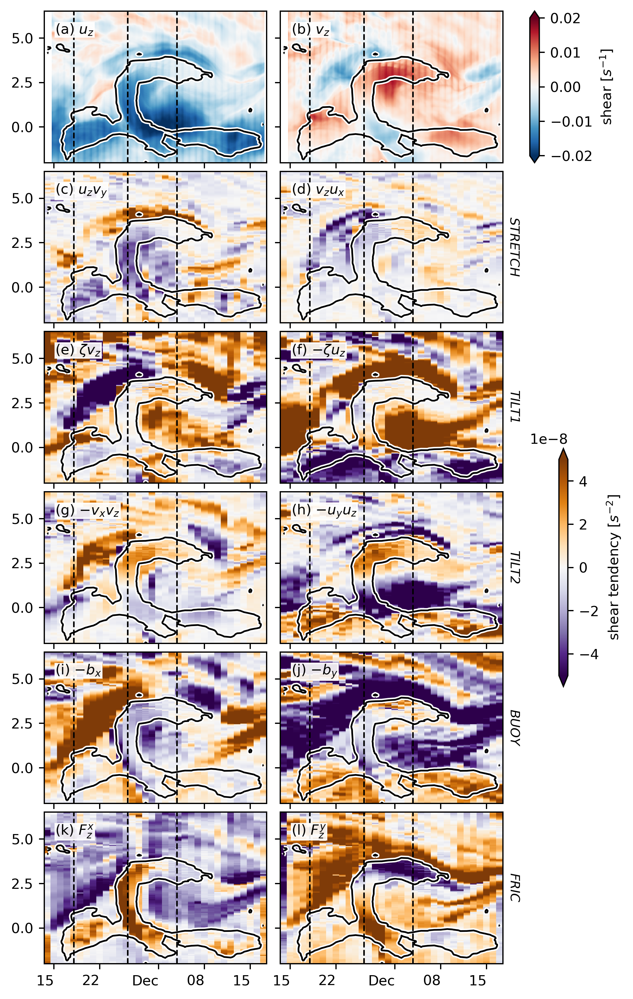

In [ ]:
def unpack(d):
    val = []
    for k, v in d.items():
        if isinstance(v, dict):
            val.extend(unpack(v))
        else:
            val.append(v)
    return val


f, ax = pump.plot.plot_shear_terms(
    period4,
    duzdt.drop_vars(["xadv", "yadv"]).resample(time="D").mean(),
    dvzdt.drop_vars(["xadv", "yadv"]).resample(time="D").mean(),
    mask_dcl=False,
)

[
    dcpy.plots.linex(snapshot_times, zorder=3, ax=aa, lw=1, ls="--", color="k")
    for aa in unpack(ax)
]

## Figure 10: N² budget

In [ ]:
mask = period4.dcl_mask.where(period4.dcl > 30, False).load()

In [ ]:
dN2dt = pump.calc.estimate_N2_evolution_terms(period4).load()

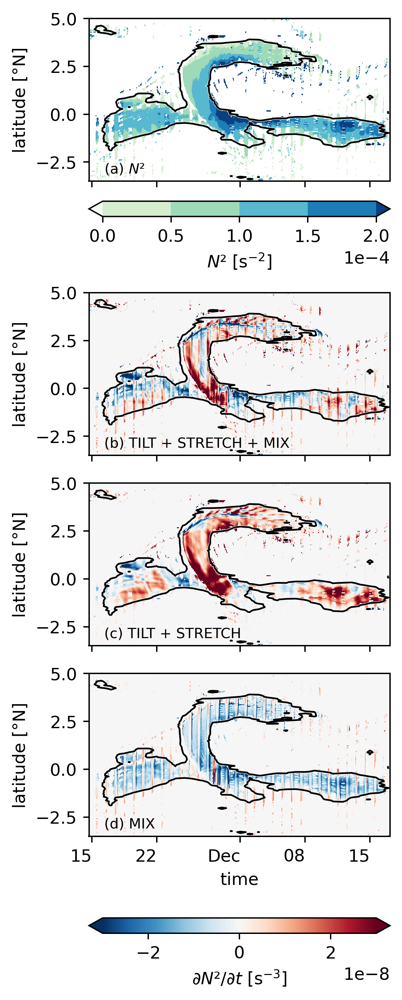

In [ ]:
f, axx = plt.subplots(
    4, 1, sharex=True, sharey=True, squeeze=False, constrained_layout=True
)

ax = dict(zip(["N2", "lag", "tilt", "mix"], axx.flat))
hN2 = (
    period4.N2.where(mask)
    .isel(longitude=1)
    .mean("depth")
    .plot(
        x="time",
        vmin=1e-5,
        vmax=2e-4,
        cmap=mpl.cm.GnBu,
        levels=np.arange(0, 2.1e-4, 5e-5),
        ylim=(-3, 5),
        ax=ax["N2"],
        add_colorbar=False,
    )
)

for key in list(ax.keys())[1:]:
    hdN2 = (
        -1 * dN2dt[key].where(mask).isel(longitude=1).fillna(0).integrate("depth")
    ).plot(
        ax=ax[key],
        vmax=3e-8,
        x="time",
        ylim=(-3.5, 5),
        add_colorbar=False,
    )
    ax[key].set_title("")

cbN2 = f.colorbar(
    hN2, ax=ax["N2"], orientation="horizontal", aspect=50, label="$N²$ [s$^{-2}$]"
)
fmt = mpl.ticker.ScalarFormatter()
fmt.set_powerlimits((-1, 1))
cbN2.ax.xaxis.set_major_formatter(fmt)

cbdN2 = f.colorbar(
    hdN2,
    ax=axx.flat[1:],
    orientation="horizontal",
    aspect=50,
    label="$∂N²/∂t$ [s$^{-3}$]",
    extend="both",
)

axx[0, 0].set_title("")

[
    period4.dcl.isel(longitude=1)
    .resample(time="D")
    .mean()
    .plot.contour(levels=[30], ax=aa, x="time", colors="w")
    for aa in axx.flat
]
[
    period4.dcl.isel(longitude=1)
    .resample(time="D")
    .mean()
    .plot.contour(levels=[30], ax=aa, x="time", colors="k", linewidths=1)
    for aa in axx.flat
]

dcpy.plots.label_subplots(
    axx.flat,
    labels=["$N²$", "TILT + STRETCH + MIX", "TILT + STRETCH", "MIX"],
    y=0.05,
    fontsize="small",
)

dcpy.plots.clean_axes(axx)
dcpy.plots.concise_date_formatter(axx.flat[-1], show_offset=False)
axx[0, 0].set_title("")

f.set_size_inches((dcpy.plots.pub_fig_width("jpo", "single column"), 8))

## Figure 11: KPP deep cycle for period4

In [ ]:
subset = period4.isel(longitude=1).sel(latitude=3.5, method="nearest")
subset.depth.attrs["axis"] = "Z"
fluxes = xr.open_dataset(f"{rootdir}/tiw_hourly/coare_fluxes_3.5N.nc")
subset2 = xr.merge([subset, fluxes]).squeeze()

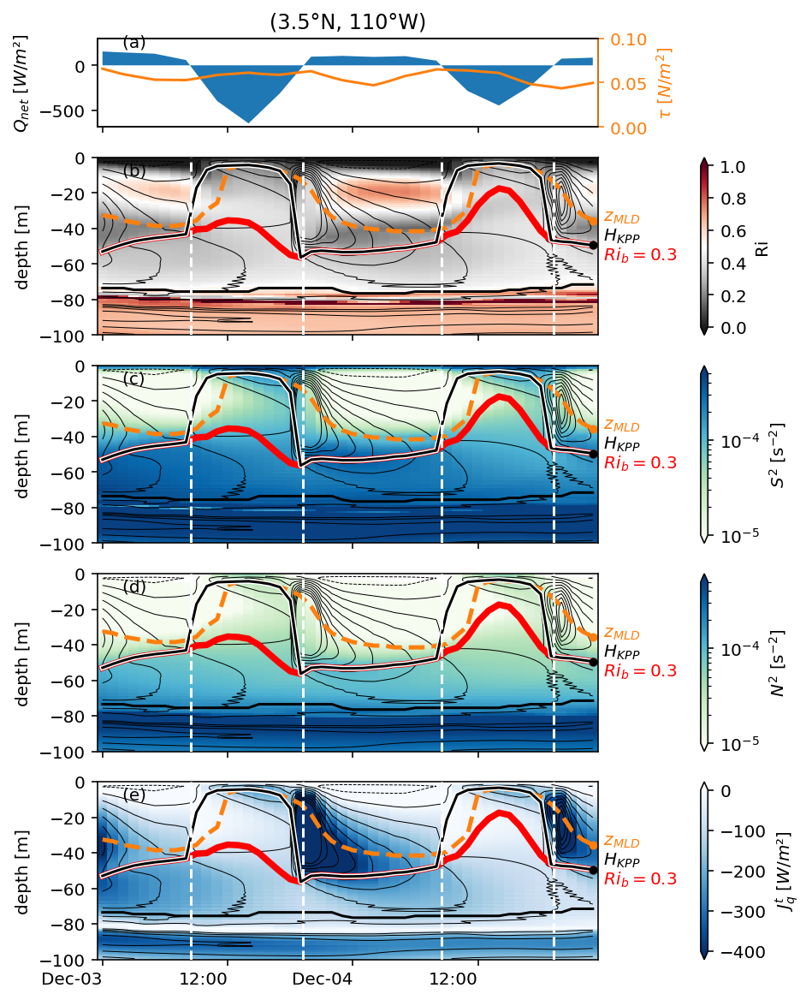

In [ ]:
%matplotlib inline

f, ax = pump.plot.plot_dcl(
    subset2.sel(time=slice("1995-12-03", "1995-12-04"), depth=slice(-100)),
    kpp_terms=False,
    lw=1.5,
)
ax[0, 0].set_title("(3.5°N, 110°W)")
ax[0, 0].set_ylim(None, 300)
dcpy.plots.label_subplots(ax.flat)
f.set_size_inches(dcpy.plots.pub_fig_width("jpo", "two column"), 8)

## Figure 12: partition KPP heat flux

In [ ]:
Jq = xr.Dataset()
Jq["Total DCL"] = period4.Jq.where(period4.dcl_mask)
Jq["Within KPP BL"] = period4.Jq.where(
    period4.dcl_mask & (period4.depth > -period4.KPPhbl)
)
Jq["Below KPP BL"] = period4.Jq.where(
    period4.dcl_mask & (period4.depth <= -period4.KPPhbl)
)
Jq = Jq.isel(longitude=1).to_array().load()

S2 = (
    1e4
    * period4.S2.where(period4.dcl_mask)
    .isel(longitude=1)
    .mean(["time", "depth"])
    .load()
)
S2.attrs["long_name"] = "Median $S²$ in low Ri layer"
S2.attrs["units"] = "$10^{-4} s^{-2}$"

N2 = (
    1e4
    * period4.N2.where(period4.dcl_mask)
    .isel(longitude=1)
    .mean(["time", "depth"])
    .load()
)
# N2.attrs["long_name"] = "Median $N²$ in low Ri layer"
N2.attrs["units"] = "$10^{-4} s^{-2}$"

kpphbl = (
    period4.KPPhbl.where(period4.dcl_mask.sum("depth") > 5).isel(longitude=1).compute()
)
kpphbl.attrs["long_name"] = "$H_{KPP}$"
kpphbl.attrs["units"] = "m"

zri = (
    np.abs(period4.dcl_base.where(period4.dcl_mask.sum("depth") > 5))
    .isel(longitude=1)
    .compute()
)
zri.attrs["long_name"] = "$z_{MLD} - z_{Ri}$"
zri.attrs["units"] = "m"

mld = (
    np.abs(period4.mld.where(period4.dcl_mask.sum("depth") > 5))
    .isel(longitude=1)
    .compute()
)
mld.attrs["long_name"] = "$z_{MLD}$"
mld.attrs["units"] = "m"

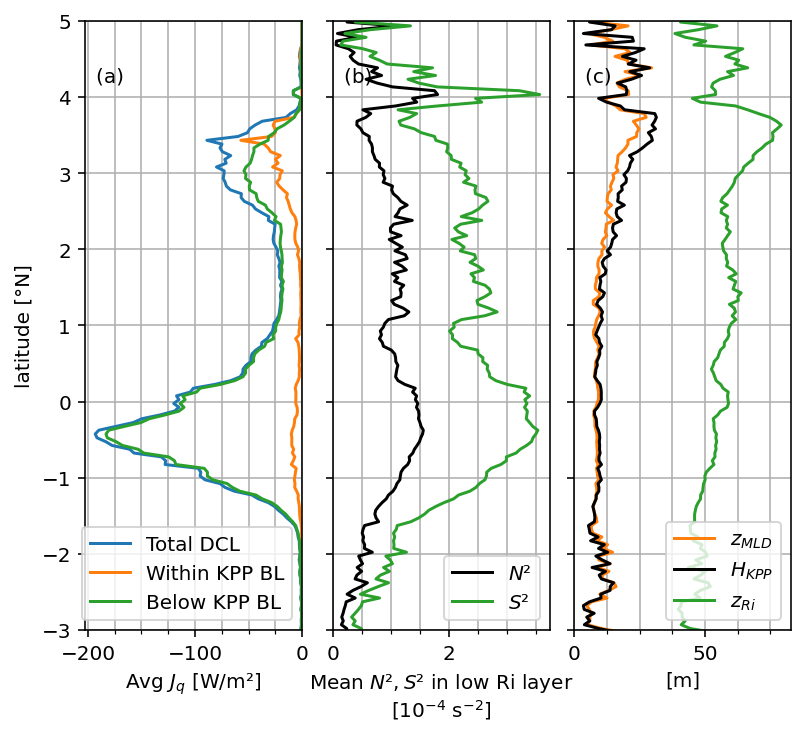

In [ ]:
f, axx = plt.subplots(1, 3, constrained_layout=1, squeeze=False, sharey=True)

ax = axx[0, 0]
(
    (
        (-1 * Jq).fillna(0).integrate("time", datetime_unit="s").integrate("depth")
        / (86400 * 30 * 50)
    ).plot.line(
        hue="variable",
        y="latitude",
        add_legend=False,
        ax=ax,
    )
)

N2.plot(ax=axx[0, 1], color="k", y="latitude")
S2.plot(ax=axx[0, 1], color="C2", y="latitude")
axx[0, 1].legend(["$N²$", "$S²$"])
axx[0, 1].set_xlabel("Mean $N²,S²$ in low Ri layer \n[$10^{-4}$ s$^{-2}$]")

((mld).mean("time").plot(ax=axx[0, 2], y="latitude", color="C1"))
((kpphbl).mean("time").plot(ax=axx[0, 2], y="latitude", color="k"))
((zri).mean("time").plot(ax=axx[0, 2], y="latitude", color="C2"))

axx[0, 2].legend(["$z_{MLD}$", "$H_{KPP}$", "$z_{Ri}$"])

axx[0, 2].set_xlabel("[m]")
ax.legend(Jq["variable"].values, loc="lower right")
ax.set_xlabel("Avg $J_q$ [W/m²]")
# ax.set_title("Parameterized heat flux \nin low Ri layer at 110°W")
dcpy.plots.clean_axes(axx)
dcpy.plots.label_subplots(axx.flat)

for aa in axx.flat:
    aa.set_title("")
    aa.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator(4))
    aa.grid(True, which="both")
    aa.set_ylim((-3, 5))

for aa in axx.flat[1:]:
    aa.set_xlim((0, None))
axx[0, 0].set_xlim((None, 0))

f.set_size_inches((dcpy.plots.pub_fig_width("jpo", "medium 2"), 5))

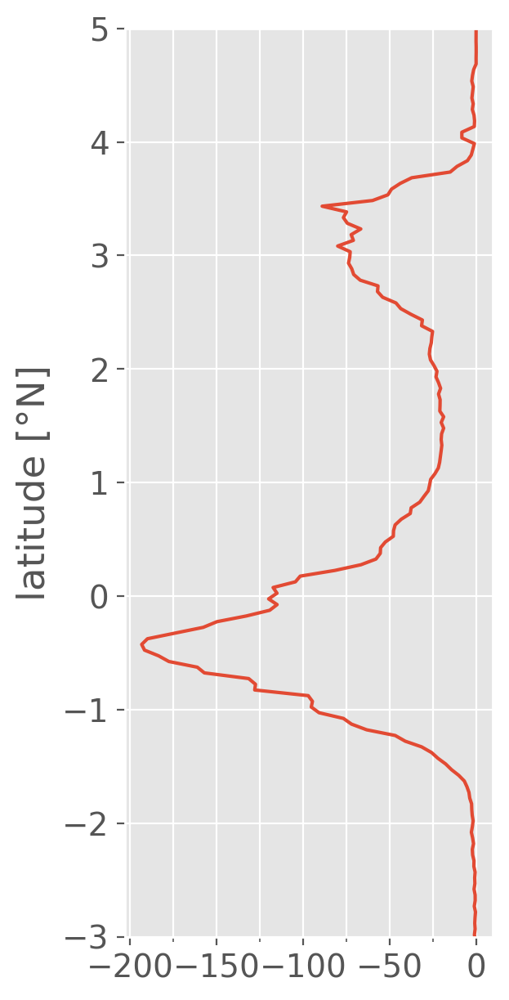

In [ ]:
plt.style.use("ggplot")

with plt.rc_context({"font.size": "14"}):
    f, axx = plt.subplots(1, 1, constrained_layout=1, squeeze=False, sharey=True)

    ax = axx[0, 0]
    (
        (
            (-1 * Jq.sel(variable="Total DCL"))
            .fillna(0)
            .integrate("time", datetime_unit="s")
            .integrate("depth")
            / (86400 * 30 * 50)
        ).plot.line(
            y="latitude",
            add_legend=False,
            ax=ax,
        )
    )
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylim([-5, 6])
    # ax.set_xlabel("Mean turbulent heat flux\nover 1 TIW [W/m²]")
    f.set_size_inches((3, 6))

for aa in axx.flat:
    aa.set_title("")
    aa.xaxis.set_minor_locator(mpl.ticker.AutoMinorLocator(2))
    aa.grid(True, which="both")
    aa.set_ylim((-3, 5))

In [ ]:
subset = period4.isel(longitude=1).sel(time=slice("1995-11-15", "1995-12-15"))
subset.Jq.load()
subset.dcl.load()

<xarray.DataArray 'dcl' (time: 744, latitude: 400)>
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [5., 4., 5., ..., 2., 1., 2.],
       [3., 5., 3., ..., 0., 1., 0.],
       [3., 4., 3., ..., 0., 0., 0.]], dtype=float32)
Coordinates:
  * latitude   (latitude) float32 -10.0 -9.95 -9.9 -9.85 ... 9.85 9.9 9.95 10.0
    longitude  float64 -110.0
  * time       (time) datetime64[ns] 1995-11-15 ... 1995-12-15T23:00:00
Attributes:
    long_name:    MLD
    units:        m
    description:  Interpolate density to 1m grid. Search for max depth where ...

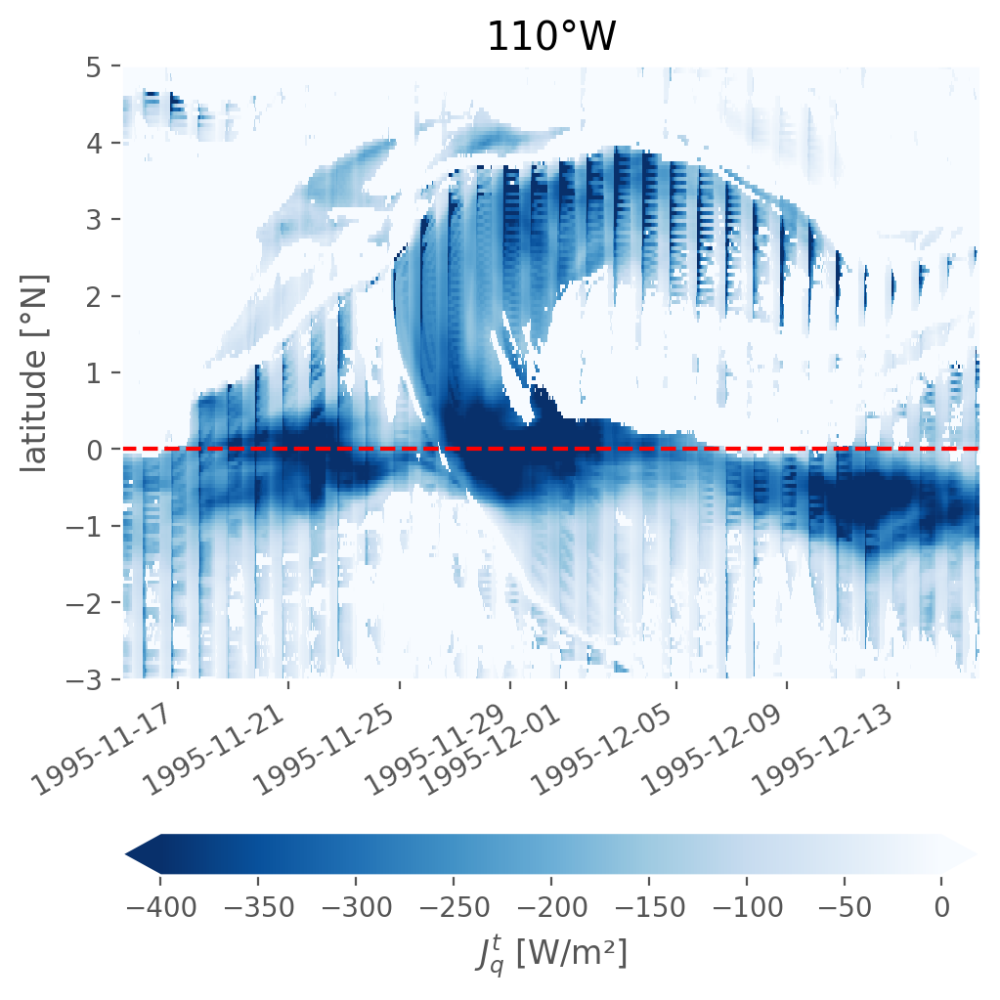

In [ ]:
f, ax = plt.subplots(1, 1, constrained_layout=True)

(subset.Jq.where(subset.dcl > 10).sum("depth") / 50).plot(
    x="time",
    vmin=-400,
    vmax=0,
    cmap=mpl.cm.Blues_r,
    cbar_kwargs={"orientation": "horizontal"},
)
ax.set_ylim(-3, 5)
ax.set_xlabel("")
ax.set_title("110°W")
dcpy.plots.liney(0, zorder=2, color="r")
f.set_size_inches((5, 5))